In [53]:
! sudo apt update -y && sudo apt-get install -y poppler-utils -qq

Hit:1 http://deb.debian.org/debian bullseye InRelease
Hit:2 https://dl.yarnpkg.com/debian stable InRelease                   
Hit:3 http://deb.debian.org/debian-security bullseye-security InRelease
Hit:4 http://deb.debian.org/debian bullseye-updates InRelease
Reading package lists... Done3m
Building dependency tree... Done
Reading state information... Done
6 packages can be upgraded. Run 'apt list --upgradable' to see them.


In [54]:
! pip install pdf2image fpdf2 datasets

In [75]:
import datasets
from pdf2image import convert_from_bytes
from fpdf import FPDF
from io import BytesIO
from PIL import Image
import os
import json
import pandas as pd
SELECT_RANGE = 10

In [56]:
dataset = datasets.load_dataset("cc_news")

In [57]:
dataset = dataset["train"]

In [58]:
sample = dataset.select(range(10))["text"]

In [59]:
class SimpleDoc(FPDF):
    def __init__(self) -> None:
        super().__init__()
        self.ch = 8
        return

    def header(self) -> None:
        return

    def footer(self) -> None:
        return
    
    def body(self, text: str) -> None:
        ch = self.ch
        text = text.encode("UTF-8")
        self.add_page()
        self.set_font('Arial', 'B', 8)
        self.multi_cell(0, 5, text.decode("Latin-1"))
        # Line break
        self.ln()

In [60]:
doc = SimpleDoc()

In [61]:
sample[-1]

'Looking for your next audition shoe? Shot at and in collaboration with Broadway Dance Center, Só Dança has launched a new collection of shoes working with some pretty famous faces of the musical theater world! Offered in two different styles and either 2.5" or 3" heels, top industry professionals are loving how versatile and supportive these shoes are! Pro tip: The heel is centered under the body so you can feel confident and stable!'

In [62]:
doc.body(text=sample[-1])

/tmp/ipykernel_459/233455760.py:17: UserWarning: Substituting font arial by core font helvetica
  self.set_font('Arial', 'B', 8)


In [63]:
stream = BytesIO(doc.output(dest="S"))
stream.seek(0)
images = convert_from_bytes(stream.read(), 200)
for i, image in enumerate(images):
    image.save("/tmp/test.png")

/tmp/ipykernel_459/2280367534.py:1: DeprecationWarning: "dest" parameter is deprecated, unused and will soon be removed
  stream = BytesIO(doc.output(dest="S"))


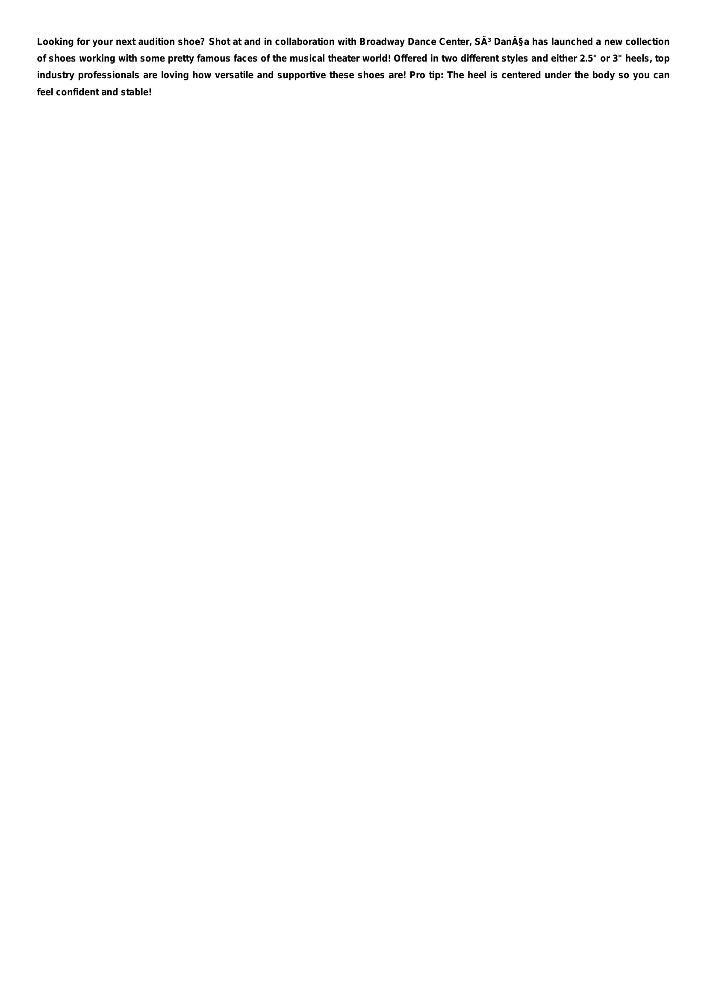

In [64]:
Image.open("/tmp/test.png")

### Load Data And Product Image Dataset

In [76]:
doc_set = (
    dataset
    .shuffle()
    .select(range(SELECT_RANGE))
    .select_columns(["text"])
).to_pandas()


In [68]:
metadata = []
for i, row in enumerate(doc_set.itertuples()):
    doc = SimpleDoc()
    doc.body(text=row.text)
    stream = BytesIO(doc.output(dest="S"))
    stream.seek(0)
    base_dir = "/tmp/cc_news_images"
    if not os.path.exists(base_dir):
        os.mkdir(base_dir)
    for j, image in enumerate(convert_from_bytes(stream.read(), 200)):
        filename = f"{base_dir}/doc_{i}-{j}.png"
        record = dict(file_name=f"doc_{i}-{j}.png", text=row.text)
        metadata.append(record)
        image.save(filename)
    del(doc)
    del(stream)

/tmp/ipykernel_459/233455760.py:17: UserWarning: Substituting font arial by core font helvetica
  self.set_font('Arial', 'B', 8)
/tmp/ipykernel_459/4256289548.py:5: DeprecationWarning: "dest" parameter is deprecated, unused and will soon be removed
  stream = BytesIO(doc.output(dest="S"))
/tmp/ipykernel_459/233455760.py:17: UserWarning: Substituting font arial by core font helvetica
  self.set_font('Arial', 'B', 8)
/tmp/ipykernel_459/4256289548.py:5: DeprecationWarning: "dest" parameter is deprecated, unused and will soon be removed
  stream = BytesIO(doc.output(dest="S"))
/tmp/ipykernel_459/233455760.py:17: UserWarning: Substituting font arial by core font helvetica
  self.set_font('Arial', 'B', 8)
/tmp/ipykernel_459/4256289548.py:5: DeprecationWarning: "dest" parameter is deprecated, unused and will soon be removed
  stream = BytesIO(doc.output(dest="S"))
/tmp/ipykernel_459/233455760.py:17: UserWarning: Substituting font arial by core font helvetica
  self.set_font('Arial', 'B', 8)
/

In [69]:
metadata

[{'file_name': 'doc_0-0.png',
  'text': 'Sign in using you account with: {* loginWidget *}\nSign in using your wpxi profile\nWelcome back. Please sign in\nWhy are we asking this?\nBy submitting your registration information, you agree to our Terms of Service and Privacy Policy .\nAlready have an account?\nWe have sent a confirmation email to {* data_emailAddress *}. Please check your email and click on the link to activate your account.\nThank you for registering!\nThank you for registering!\nWe look forward to seeing you on [website] frequently. Visit us and sign in to update your profile, receive the latest news and keep up to date with mobile alerts.\nClick here to return to the page you were visiting.'},
 {'file_name': 'doc_1-0.png',
  'text': 'The Supreme Court over the next month is poised to upend the way the country picks representatives to Congress, decide whether the First Amendment protects people who refuse to do business with same-sex couples and rule on whether President 

In [70]:
pd.DataFrame(metadata).to_csv(f"{base_dir}/metadata.csv", index=False)

In [72]:
dt = datasets.load_dataset("imagefolder", data_dir="/tmp/cc_news_images/")

Resolving data files: 100%|██████████| 11215/11215 [00:00<00:00, 106344.19it/s]
Extracting data files: 0it [00:00, ?it/s]
Generating train split: 11214 examples [00:00, 13544.03 examples/s]


In [74]:
dt.push_to_hub("lowem1/cc_news_images")

Pushing dataset shards to the dataset hub: 100%|██████████| 7/7 [50:17<00:00, 431.07s/it]
